In [6]:
import tensorflow as tf
import numpy as np
import cv2 as cv2
from matplotlib import pyplot as plt
from tensorflow.keras.layers import Dense 
from tensorflow.keras import Model
from PIL import Image

In [3]:
class PositionalEncoding():
    def __init__(self, image, batch_size, L=10):
      super().__init__()

      self.dataset = [np.array([-1, -1, -1, -1, -1])] * H * W
      self.batch_count = 0;
      self.batch_size = batch_size
      self.image = image
      self.L = L

      self.create_dataset(H, W)

      self.inds = np.arange(len(self.dataset))
      np.random.shuffle(self.inds)

    def get_batch(self, batch_size):
        inputs, targets, inds = [], [], []
        for i in range(batch_size):
          if self.batch_count * batch_size + i >= len(self.dataset):
            self.batch_count = 0
            np.random.shuffle(self.inds)
          
          data = self.dataset[self.inds[self.batch_count * batch_size + i]]
          r, g, b = data[-3], data[-2], data[-1]
          targets.append([r, g, b])
          inputs.append(data[:-5])
          inds.append([data[-5], data[-4]])
        
        self.batch_count += 1
        return np.array(inputs), np.array(targets), np.array(inds);
      
    def create_dataset(self, H, W):
        """create dataset using the input image"""
        H, W, C = self.image.shape
        x_sin, x_cos, y_sin, y_cos = self.get_gamma_encoding()

        for y in range(H):
            for x in range(W):
                r, g, b = self.image[y, x]
                data = []

                for l in range(self.L):
                  data.append(x_sin[l][x])
                  data.append(x_cos[l][x])
                  data.append(y_sin[l][y])
                  data.append(y_cos[l][y])
                data = data + [x, y, r*2-1, g*2-1, b*2-1]
                self.dataset[W*y + x] = np.array(data)

    def get_gamma_encoding(self):
        x_linspace = (np.linspace(0, W-1, W)/W)*2 -1 
        y_linspace = (np.linspace(0, H-1, H)/H)*2 -1
        
        x_sin, x_cos, y_sin, y_cos = [], [], [], []

        for e in range(self.L):
          val = 2**e

          x_sin.append(np.sin(val * np.pi * x_linspace))
          x_cos.append(np.cos(val * np.pi * x_linspace))
          y_sin.append(np.sin(val * np.pi * y_linspace))
          y_cos.append(np.cos(val * np.pi * y_linspace))
        return x_sin, x_cos, y_sin, y_cos

In [4]:
def build_model():
  model = tf.keras.Sequential([
      tf.keras.layers.Dense(128, activation='relu'),
      tf.keras.layers.Dense(128, activation='relu'),
      tf.keras.layers.Dense(3, activation='linear')
  ])
  return model

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/optimizer_v2.py:356: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


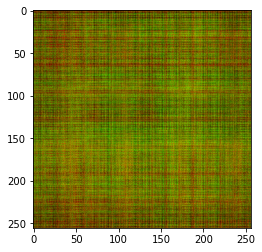

loss = 0.6140007609229079, learning rate = 0.009999999776482582, batch size = 1024


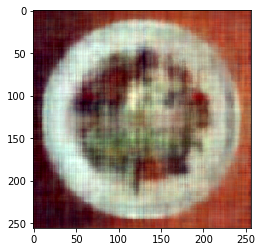

loss = 0.2710785611429652, learning rate = 0.009999999776482582, batch size = 1024


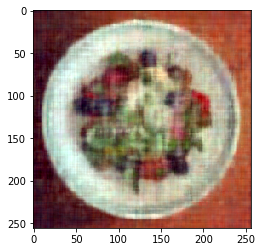

loss = 0.21829445271304765, learning rate = 0.009999999776482582, batch size = 1024


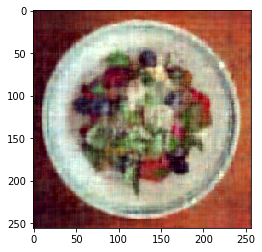

loss = 0.2133646421225846, learning rate = 0.009999999776482582, batch size = 1024


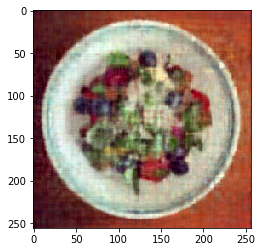

loss = 0.19321349449728534, learning rate = 0.009999999776482582, batch size = 1024


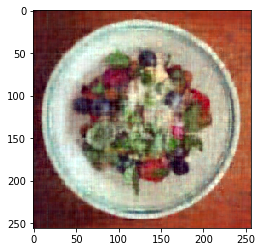

loss = 0.20467112890687508, learning rate = 0.009999999776482582, batch size = 1024


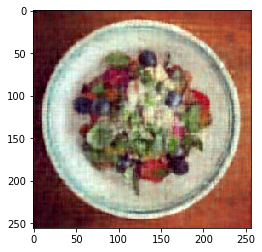

loss = 0.20022093446104636, learning rate = 0.009999999776482582, batch size = 1024


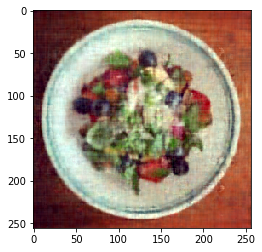

loss = 0.17916759658912218, learning rate = 0.009999999776482582, batch size = 1024


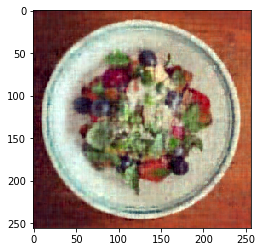

loss = 0.17751558692084907, learning rate = 0.009999999776482582, batch size = 1024


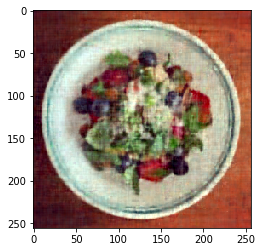

loss = 0.1836166570454773, learning rate = 0.009999999776482582, batch size = 1024


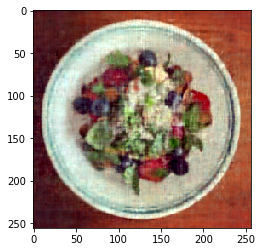

loss = 0.18033450199014117, learning rate = 0.009999999776482582, batch size = 1024


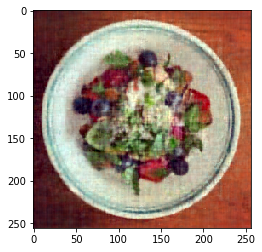

loss = 0.17392460149571587, learning rate = 0.009999999776482582, batch size = 1024


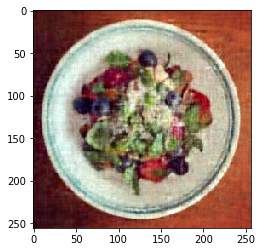

loss = 0.17439809856425437, learning rate = 0.009999999776482582, batch size = 1024


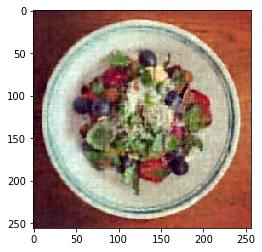

loss = 0.1669799119776439, learning rate = 0.009999999776482582, batch size = 1024


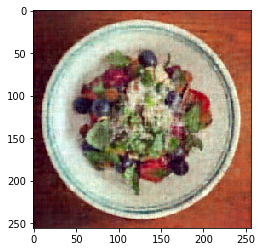

loss = 0.16494454832003447, learning rate = 0.009999999776482582, batch size = 1024


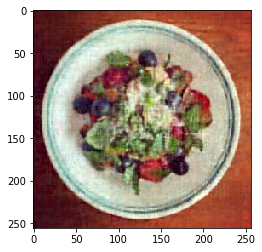

loss = 0.16279752435471403, learning rate = 0.009999999776482582, batch size = 1024


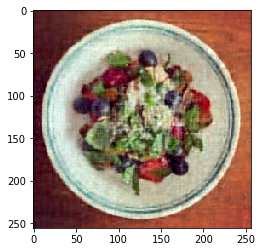

loss = 0.17842026298229685, learning rate = 0.009999999776482582, batch size = 1024


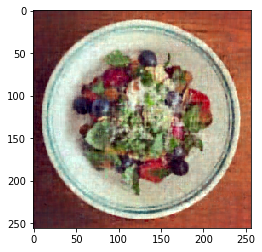

loss = 0.16123667173046455, learning rate = 0.009999999776482582, batch size = 1024


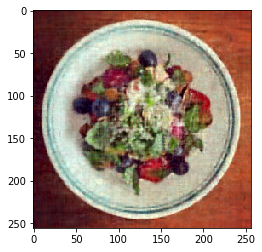

loss = 0.16635437792699112, learning rate = 0.009999999776482582, batch size = 1024


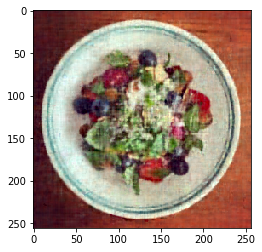

loss = 0.1635987846944218, learning rate = 0.009999999776482582, batch size = 1024


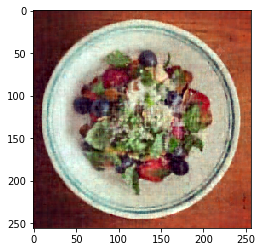

loss = 0.15078534926144233, learning rate = 0.009999999776482582, batch size = 1024


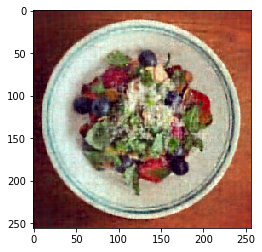

loss = 0.15083467890822455, learning rate = 0.009999999776482582, batch size = 1024


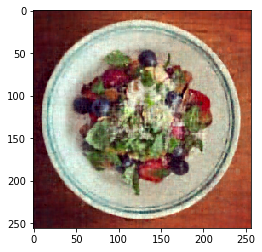

loss = 0.1637917054916306, learning rate = 0.009999999776482582, batch size = 1024


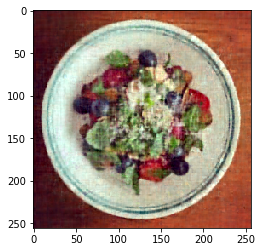

loss = 0.15686200211543452, learning rate = 0.009999999776482582, batch size = 1024


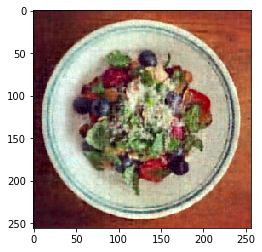

loss = 0.14769642702099334, learning rate = 0.009999999776482582, batch size = 1024


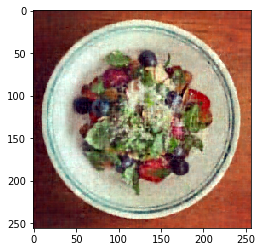

loss = 0.15213167272029224, learning rate = 0.009999999776482582, batch size = 1024


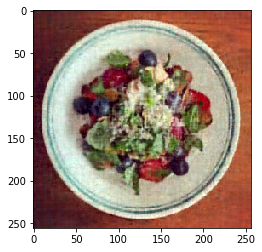

loss = 0.15050218828565273, learning rate = 0.009999999776482582, batch size = 1024


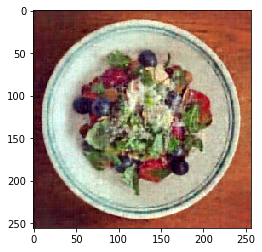

loss = 0.15002533281509003, learning rate = 0.009999999776482582, batch size = 1024


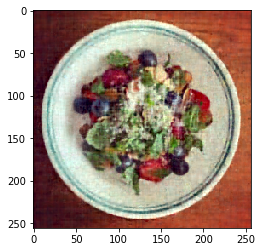

loss = 0.1545608411369046, learning rate = 0.009999999776482582, batch size = 1024


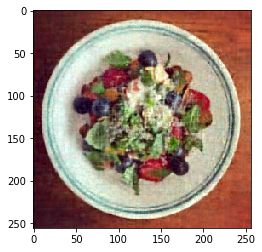

loss = 0.15354241848347044, learning rate = 0.009999999776482582, batch size = 1024


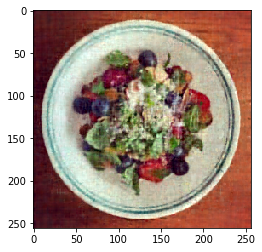

loss = 0.15021929952411037, learning rate = 0.009999999776482582, batch size = 1024


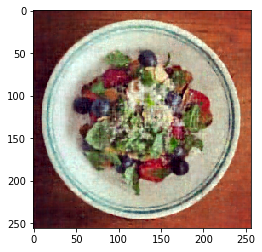

loss = 0.1477111373793485, learning rate = 0.009999999776482582, batch size = 1024


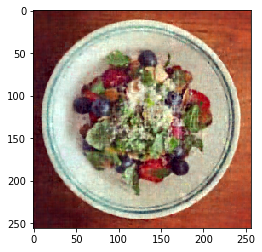

loss = 0.15170691727874291, learning rate = 0.009999999776482582, batch size = 1024


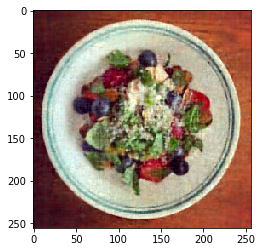

loss = 0.15027918340309515, learning rate = 0.009999999776482582, batch size = 1024


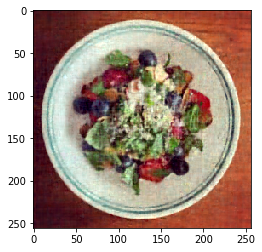

loss = 0.1466646991899407, learning rate = 0.009999999776482582, batch size = 1024


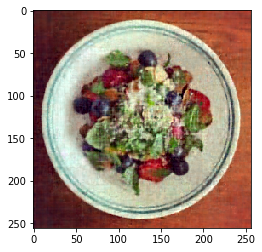

loss = 0.14671048832749503, learning rate = 0.009999999776482582, batch size = 1024


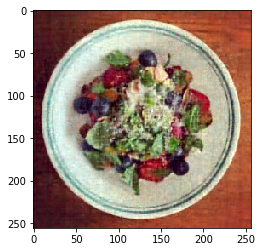

loss = 0.14642149529322881, learning rate = 0.009999999776482582, batch size = 1024


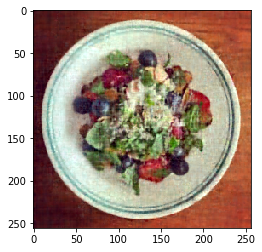

loss = 0.14358796493034579, learning rate = 0.009999999776482582, batch size = 1024


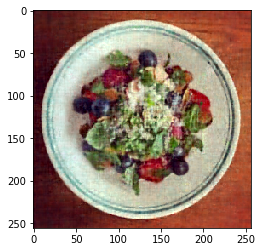

loss = 0.14989326027055047, learning rate = 0.009999999776482582, batch size = 1024


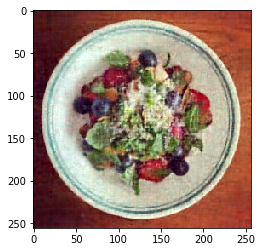

loss = 0.1428976658733587, learning rate = 0.009999999776482582, batch size = 1024


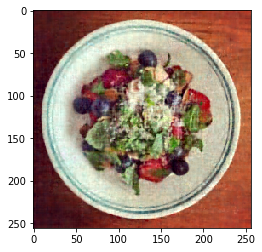

loss = 0.13732110572425674, learning rate = 0.009999999776482582, batch size = 1024


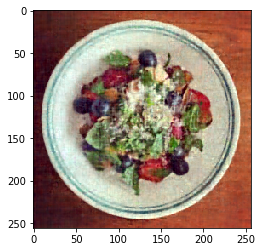

loss = 0.14534853211637014, learning rate = 0.009999999776482582, batch size = 1024


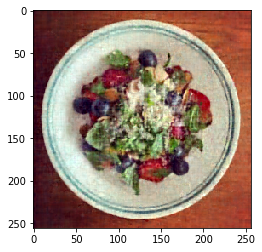

loss = 0.1399883854254615, learning rate = 0.009999999776482582, batch size = 1024


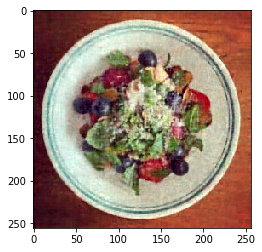

loss = 0.14237561933769577, learning rate = 0.009999999776482582, batch size = 1024


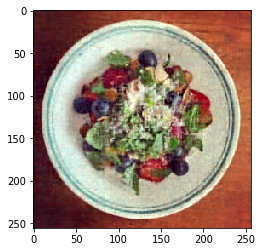

loss = 0.13827964221429154, learning rate = 0.009999999776482582, batch size = 1024


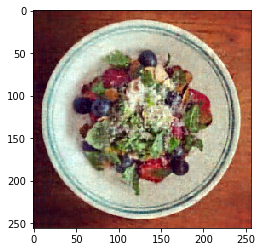

loss = 0.13713374505459142, learning rate = 0.009999999776482582, batch size = 1024


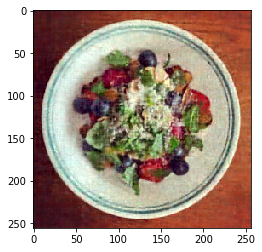

loss = 0.1510063608330588, learning rate = 0.009999999776482582, batch size = 1024


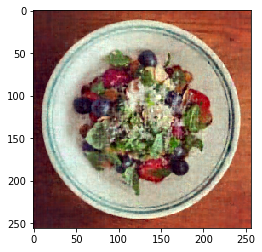

loss = 0.13672481250945387, learning rate = 0.009999999776482582, batch size = 1024


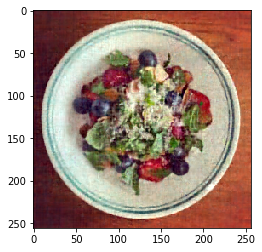

loss = 0.1393998474373044, learning rate = 0.009999999776482582, batch size = 1024


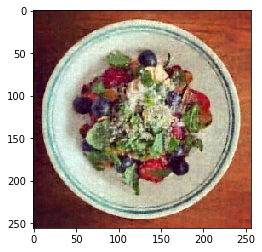

loss = 0.1470747558206233, learning rate = 0.009999999776482582, batch size = 1024


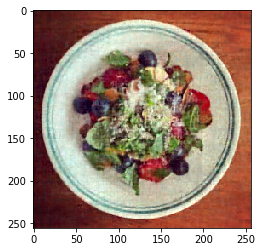

loss = 0.12742934041984272, learning rate = 0.009999999776482582, batch size = 1024


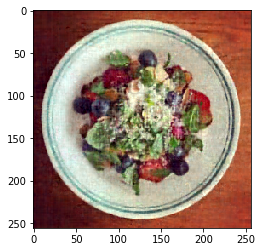

loss = 0.13402287733538537, learning rate = 0.009999999776482582, batch size = 1024


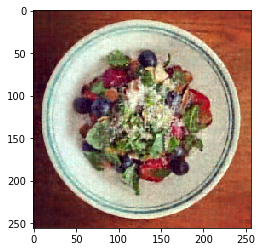

loss = 0.13839692407007184, learning rate = 0.009999999776482582, batch size = 1024


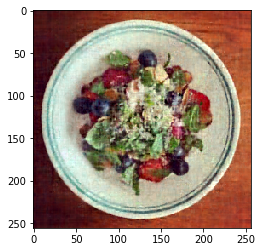

loss = 0.137325405494967, learning rate = 0.009999999776482582, batch size = 1024


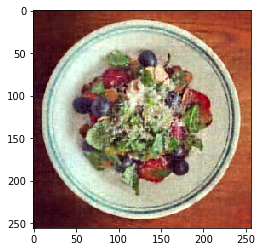

loss = 0.12891398031001983, learning rate = 0.009999999776482582, batch size = 1024


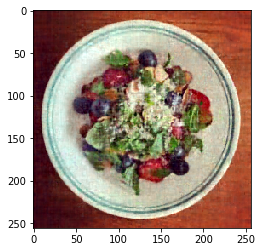

loss = 0.14033855961936184, learning rate = 0.009999999776482582, batch size = 1024


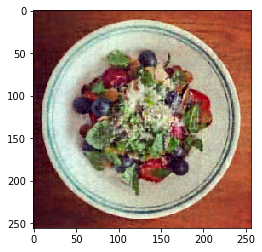

loss = 0.1343600486599186, learning rate = 0.009999999776482582, batch size = 1024


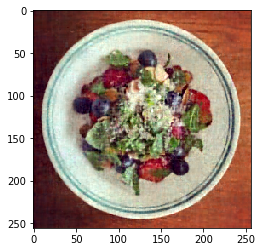

loss = 0.13188630307603239, learning rate = 0.009999999776482582, batch size = 1024


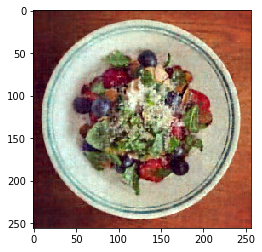

loss = 0.13147158962335842, learning rate = 0.009999999776482582, batch size = 1024


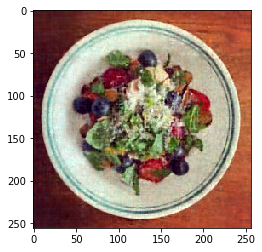

loss = 0.13303291039195717, learning rate = 0.009999999776482582, batch size = 1024


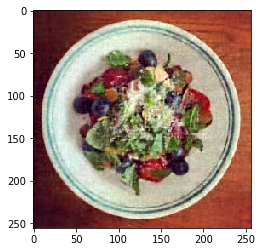

loss = 0.13766358733783876, learning rate = 0.009999999776482582, batch size = 1024


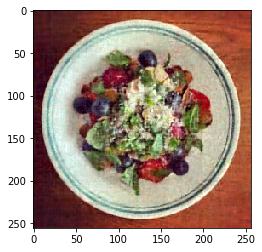

loss = 0.13168018465449008, learning rate = 0.009999999776482582, batch size = 1024


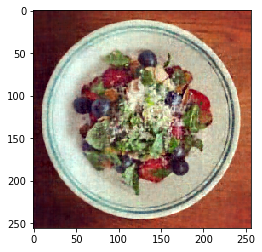

loss = 0.13509990862879287, learning rate = 0.009999999776482582, batch size = 1024


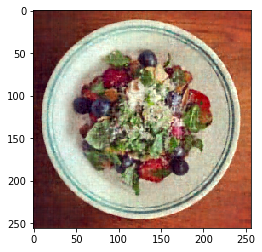

loss = 0.13172498201807042, learning rate = 0.009999999776482582, batch size = 1024


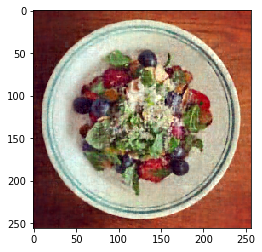

loss = 0.1322242316825234, learning rate = 0.009999999776482582, batch size = 1024


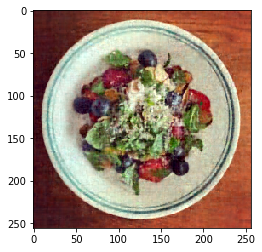

loss = 0.13193221638579608, learning rate = 0.009999999776482582, batch size = 1024


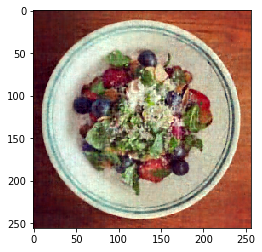

loss = 0.13512021560121126, learning rate = 0.009999999776482582, batch size = 1024


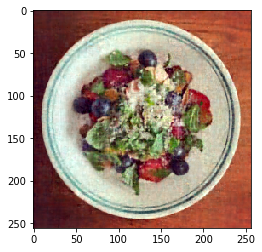

loss = 0.1367109160222434, learning rate = 0.009999999776482582, batch size = 1024


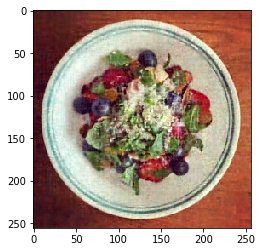

loss = 0.1418376204638492, learning rate = 0.009999999776482582, batch size = 1024


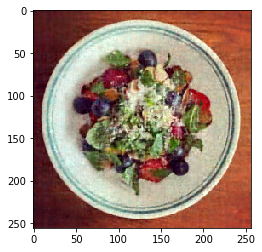

loss = 0.13140511939779145, learning rate = 0.009999999776482582, batch size = 1024


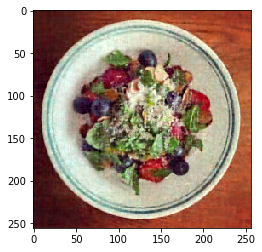

loss = 0.12710713068616714, learning rate = 0.009999999776482582, batch size = 1024


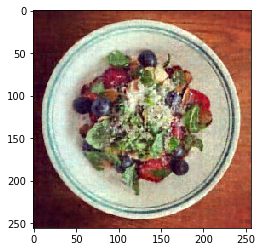

loss = 0.1338700028772675, learning rate = 0.009999999776482582, batch size = 1024


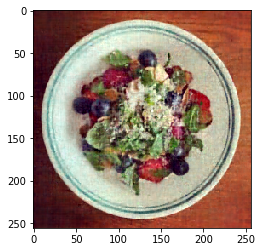

loss = 0.1317730435712502, learning rate = 0.009999999776482582, batch size = 1024


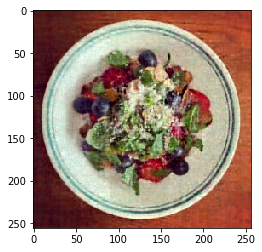

loss = 0.13722579800560863, learning rate = 0.009999999776482582, batch size = 1024


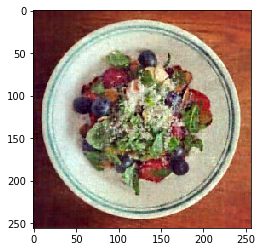

loss = 0.13196107082711392, learning rate = 0.009999999776482582, batch size = 1024


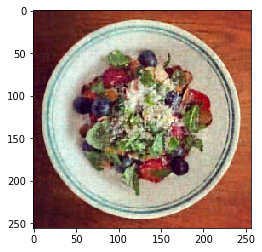

loss = 0.12335507834152966, learning rate = 0.009999999776482582, batch size = 1024


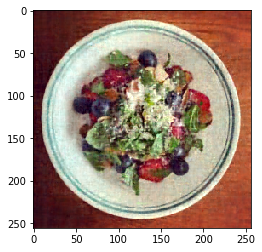

loss = 0.13382165052493414, learning rate = 0.009999999776482582, batch size = 1024


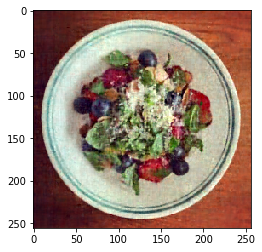

loss = 0.12828314343029687, learning rate = 0.009999999776482582, batch size = 1024


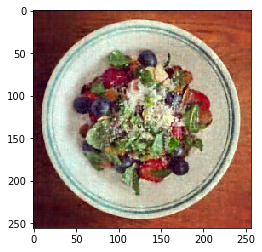

loss = 0.12506931588426773, learning rate = 0.009999999776482582, batch size = 1024


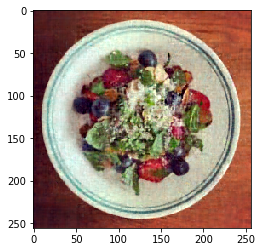

loss = 0.1311849912796115, learning rate = 0.009999999776482582, batch size = 1024


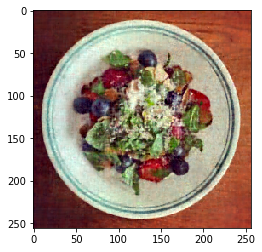

loss = 0.1319892839178439, learning rate = 0.009999999776482582, batch size = 1024


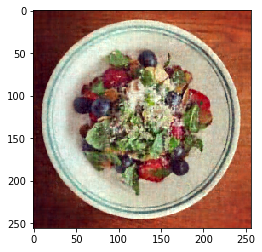

loss = 0.1271083176656215, learning rate = 0.009999999776482582, batch size = 1024


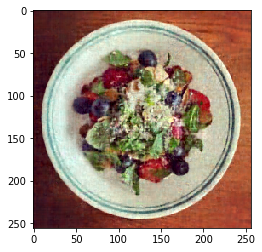

loss = 0.13328679329277748, learning rate = 0.009999999776482582, batch size = 1024


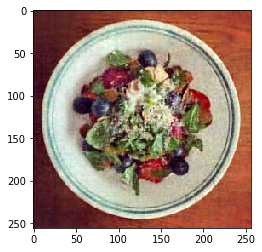

loss = 0.13229681625130627, learning rate = 0.009999999776482582, batch size = 1024


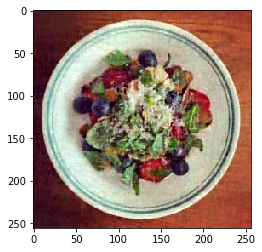

loss = 0.1289493098732873, learning rate = 0.009999999776482582, batch size = 1024


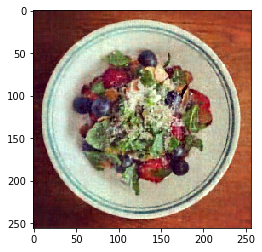

loss = 0.1329613650722074, learning rate = 0.009999999776482582, batch size = 1024


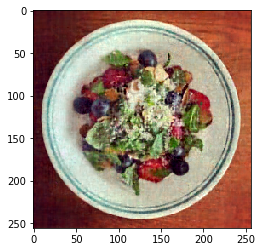

loss = 0.12673550072904757, learning rate = 0.009999999776482582, batch size = 1024


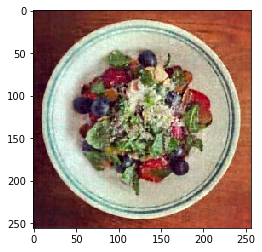

loss = 0.12984559952971375, learning rate = 0.009999999776482582, batch size = 1024


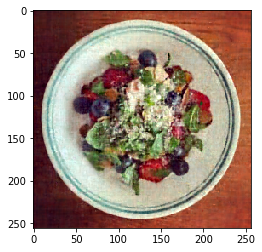

loss = 0.13425427325336547, learning rate = 0.009999999776482582, batch size = 1024


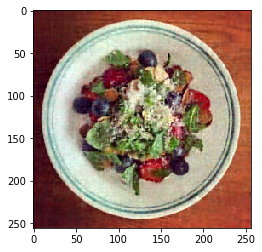

loss = 0.13295958592744228, learning rate = 0.009999999776482582, batch size = 1024


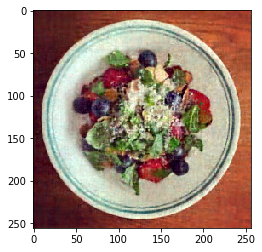

loss = 0.12334530456608084, learning rate = 0.009999999776482582, batch size = 1024


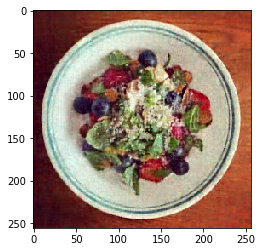

loss = 0.13112883083649635, learning rate = 0.009999999776482582, batch size = 1024


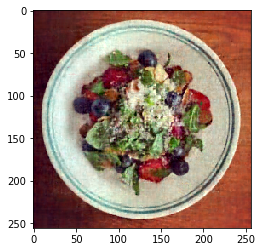

loss = 0.1306617939043614, learning rate = 0.009999999776482582, batch size = 1024


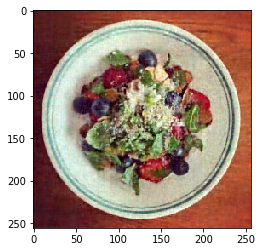

loss = 0.12765083789442114, learning rate = 0.009999999776482582, batch size = 1024


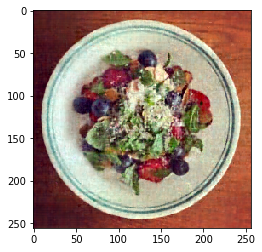

loss = 0.12609979235696675, learning rate = 0.009999999776482582, batch size = 1024


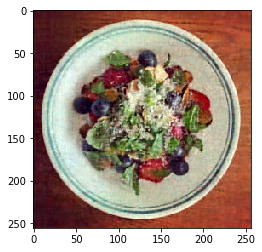

loss = 0.12657623098793105, learning rate = 0.009999999776482582, batch size = 1024


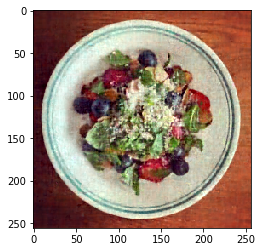

loss = 0.1216766418271801, learning rate = 0.009999999776482582, batch size = 1024


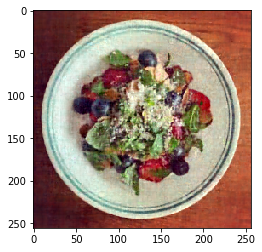

loss = 0.1322929443900914, learning rate = 0.009999999776482582, batch size = 1024


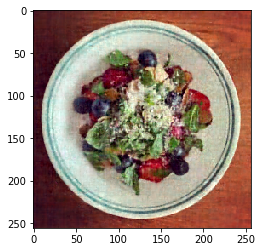

loss = 0.1275924722671531, learning rate = 0.009999999776482582, batch size = 1024


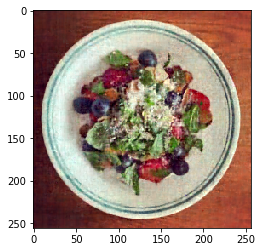

loss = 0.12870514238709263, learning rate = 0.009999999776482582, batch size = 1024


In [10]:
im = Image.open('/content/salad.jpg')
im = np.array(im) / 255.0
H, W, C = im.shape

positional_encoding = PositionalEncoding(im, 1024)
model = build_model()
loss_object = tf.keras.losses.MeanSquaredError()
optimizer = tf.keras.optimizers.Adam(lr=1e-2)

count = 0
framebuffer = np.zeros((H, W, 3))
dataset_size = len(positional_encoding.dataset)


for i in range(10000):
  inputs, targets, inds = positional_encoding.get_batch(batch_size=1024)

  with tf.GradientTape() as tape:
    output = model(inputs, training=True)
    loss = tf.sqrt(loss_object(output, targets))
  gradients = tape.gradient(loss, model.trainable_variables)
  optimizer.apply_gradients(zip(gradients, model.trainable_variables))   

  if i%100 == 0:
      inputs, targets, inds = positional_encoding.get_batch(batch_size=dataset_size)
      output = model(inputs, training=False)
      
      inds_int = inds.astype('int')
      inds_int = inds_int[:, 1] * W + inds_int[:, 0]
      np.put(framebuffer[:, :, 0], inds_int, np.clip((output[:, 0]+1)/2.0, 0, 1))
      np.put(framebuffer[:, :, 1], inds_int, np.clip((output[:, 1]+1)/2.0, 0, 1))
      np.put(framebuffer[:, :, 2], inds_int, np.clip((output[:, 2]+1)/2.0, 0, 1))

      plt.imshow(framebuffer, interpolation='nearest')
      plt.show()
      # fileName = 'train_' + '{:03d}.jpg'.format(i)
      # save_img = np.copy(framebuffer[...,::-1]*255.0)
      # cv2.imwrite(fileName, save_img.astype('uint8'))
      print('loss = {}, learning rate = {}, batch size = {}'.format(loss.numpy(), optimizer.learning_rate.numpy(), 1024))        

                                                                              
                                                                          